In [1]:
import numpy as np
import glob
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import tqdm
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader, Dataset
import torch.nn.functional as F
import re
device = 'cuda'  # Use GPU if available
# device = 'cpu'  # Use CPU if CUDA is not available

In [2]:
print(torch.version.cuda)

13.0


In [3]:
def plot_wavefield_video(wavefield_vx, wavefield_vz, save=False, title=None):
    """
    Visualize a 2D elastic wavefield as an animated video.
    Plots Vx and Vz components side by side over time.

    Parameters:
        wavefield_vx (ndarray): Wavefield component in x direction, shape (nt, nz, nx)
        wavefield_vz (ndarray): Wavefield component in z direction, shape (nt, nz, nx)
        save (bool): Whether to save the animation as a GIF
        title (str): Filename prefix for saving the animation (if save=True)

    Returns:
        HTML animation object (for Jupyter display)
    """
    # Extract time, vertical, and horizontal dimensions
    nt, nz, nx = wavefield_vx.shape

    # Set color scale limits based on max absolute wave amplitude (capped at 30%)
    vmax = np.max(np.abs([wavefield_vx, wavefield_vz])) * 0.3

    # Create side-by-side subplots for Vx and Vz
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Initialize first frame of Vx wavefield
    im0 = axes[0].imshow(wavefield_vx[0, :, :], cmap='seismic', 
                         extent=[0, 128*20/1000, 64*20/1000, 0],
                         vmin=-vmax, vmax=vmax, animated=True)
    axes[0].set_title("Vx")
    axes[0].set_xlabel("X (km)")
    axes[0].set_ylabel("Z (km)")

    # Initialize first frame of Vz wavefield
    im1 = axes[1].imshow(wavefield_vz[0, :, :], cmap='seismic', 
                         extent=[0, 128*20/1000, 64*20/1000, 0],
                         vmin=-vmax, vmax=vmax, animated=True)
    axes[1].set_title("Vz")
    axes[1].set_xlabel("X (km)")
    axes[1].set_ylabel("Z (km)")

    fig.tight_layout()

    # Frame update function for animation
    def update(frame):
        im0.set_array(wavefield_vx[frame, :, :])
        im1.set_array(wavefield_vz[frame, :, :])
        return [im0, im1]

    # Create animation
    anim = FuncAnimation(fig, update, frames=nt, interval=50, blit=True)
    plt.close(fig)

    # Optionally save as GIF
    if save:
        anim.save(f'{title}.gif', fps=10)

    # Display inline in Jupyter
    return HTML(anim.to_jshtml())


def plot_wavefield_video_pred_gt(wavefield_vx, wavefield_vz, wavefield_vx_Y, wavefield_vz_Y, save=False, title=None):
    """
    Compare predicted and ground truth 2D elastic wavefields in an animation.
    Displays Vx and Vz for both prediction and ground truth in a 2×2 subplot.

    Parameters:
        wavefield_vx (ndarray): Predicted Vx component, shape (nt, nz, nx)
        wavefield_vz (ndarray): Predicted Vz component, shape (nt, nz, nx)
        wavefield_vx_Y (ndarray): Ground truth Vx component, shape (nt, nz, nx)
        wavefield_vz_Y (ndarray): Ground truth Vz component, shape (nt, nz, nx)
        save (bool): Whether to save the animation as a GIF
        title (str): Filename prefix for saving the animation (if save=True)

    Returns:
        HTML animation object (for Jupyter display)
    """
    # Dimensions of wavefield arrays
    nt, nz, nx = wavefield_vx.shape

    # Determine dynamic color scale limit
    vmax = np.max(np.abs([wavefield_vx, wavefield_vz])) * 0.3

    # Create 2x2 subplot layout: prediction (top), ground truth (bottom)
    fig, axes = plt.subplots(2, 2, figsize=(14, 9))

    # Plot predicted Vx
    im0 = axes[0, 0].imshow(wavefield_vx[0, :, :], cmap='seismic', 
                            extent=[0, 128*20/1000, 64*20/1000, 0],
                            vmin=-vmax, vmax=vmax, animated=True)
    axes[0, 0].set_title("Vx prediction")
    axes[0, 0].set_xlabel("X (km)")
    axes[0, 0].set_ylabel("Z (km)")

    # Plot predicted Vz
    im1 = axes[0, 1].imshow(wavefield_vz[0, :, :], cmap='seismic', 
                            extent=[0, 128*20/1000, 64*20/1000, 0],
                            vmin=-vmax, vmax=vmax, animated=True)
    axes[0, 1].set_title("Vz prediction")
    axes[0, 1].set_xlabel("X (km)")
    axes[0, 1].set_ylabel("Z (km)")

    # Plot ground truth Vx
    im2 = axes[1, 0].imshow(wavefield_vx_Y[0, :, :], cmap='seismic', 
                            extent=[0, 128*20/1000, 64*20/1000, 0],
                            vmin=-vmax, vmax=vmax, animated=True)
    axes[1, 0].set_title("Vx ground truth")
    axes[1, 0].set_xlabel("X (km)")
    axes[1, 0].set_ylabel("Z (km)")

    # Plot ground truth Vz
    im3 = axes[1, 1].imshow(wavefield_vz_Y[0, :, :], cmap='seismic', 
                            extent=[0, 128*20/1000, 64*20/1000, 0],
                            vmin=-vmax, vmax=vmax, animated=True)
    axes[1, 1].set_title("Vz ground truth")
    axes[1, 1].set_xlabel("X (km)")
    axes[1, 1].set_ylabel("Z (km)")

    fig.tight_layout()

    # Update function for all four subplots
    def update(frame):
        im0.set_array(wavefield_vx[frame, :, :])
        im1.set_array(wavefield_vz[frame, :, :])
        im2.set_array(wavefield_vx_Y[frame, :, :])
        im3.set_array(wavefield_vz_Y[frame, :, :])
        return [im0, im1, im2, im3]

    # Create the animation
    anim = FuncAnimation(fig, update, frames=nt, interval=50, blit=True)
    plt.close(fig)

    # Save as gif if requested
    if save:
        anim.save(f'{title}.gif', fps=10)

    # Display inline
    return HTML(anim.to_jshtml())


In [4]:
### LOAD ALL THE DATA FOR TRAINING + VALIDATION

# Gather all file paths from two directories: layered and random field simulations.
# Each file is assumed to represent one simulation sample.
all_waveforms = glob.glob('./layered_simulation/*') + glob.glob('./random_field_simulation/*')

number_of_samples = len(all_waveforms)
print('Number of samples for training and validation ', number_of_samples)

Number of samples for training and validation  500


# VISUALIZE DATA

Each .npy file in the folder contains a dictionary of physical and simulation parameters and partial wavefield data from a 2D elastic wave propagation simulation
| Key               | Shape / Type          | Description |
|-------------------|------------------------|-------------|
| `'ox'`, `'oz'`    | `float`                | Origin of the model (x, z = 0.0) |
| `'dx'`, `'dz'`    | `float`                | Grid spacing in x and z (20.0 m) |
| `'nx'`, `'nz'`    | `int`                  | Number of grid points (128 × 64) |
| `'nt'`            | `int`                  | Number of time steps (60) |
| `'dt'`            | `float`                | Time step size (0.03 s) |
| `'f0'`            | `float`                | Dominant source frequency (Hz) |
| `'amp'`           | `float`                | Source amplitude |
| `'source_loc'`    | `list[float]`          | Earthquake source location `[x, z]` |
| `'focal_mechanism'` | `list[float]`        | `[strike, dip, rake]` angles of the source |
| `'free_surface'`  | `bool`                 | Whether free-surface boundary is used |
| `'vp'`, `'vs'`, `'rho'` | `np.ndarray (64×128)` | P-wave, S-wave velocities (in m/s), and density (kg/m³) |
| `'wavefield_vx'`, `'wavefield_vz'` | `np.ndarray (60×64×128)` | Simulated wavefields in x and z directions — only **first 15 time steps** saved for prediction tasks |

In [5]:
# Select a sample index to visualize
id_2_show = 0

# Load the .npy file containing simulation data
sample_2_show = np.load(all_waveforms[id_2_show], allow_pickle=True)

wavefield_vx = sample_2_show.item().get('wavefield_vx') # Extract the x-direction wavefield (shape: [15, 64, 128])
wavefield_vz = sample_2_show.item().get('wavefield_vz') # Extract the z-direction wavefield (shape: [15, 64, 128])
vp = sample_2_show.item().get('vp') # Extract the P-wave velocity field (Vp) [64×128], in m/s
vs = sample_2_show.item().get('vs') # Extract the S-wave velocity field (Vs) [64×128], in m/s
foc_x, foc_z = sample_2_show.item().get('source_loc') # Get the source (focal) location in meters

# Plot and save an animated video of the wavefield (Vx and Vz components)
plot_wavefield_video(wavefield_vx, wavefield_vz, save=True, title='wavefield')

In [6]:
all_waveforms[id_2_show]

'./layered_simulation\\0.npy'

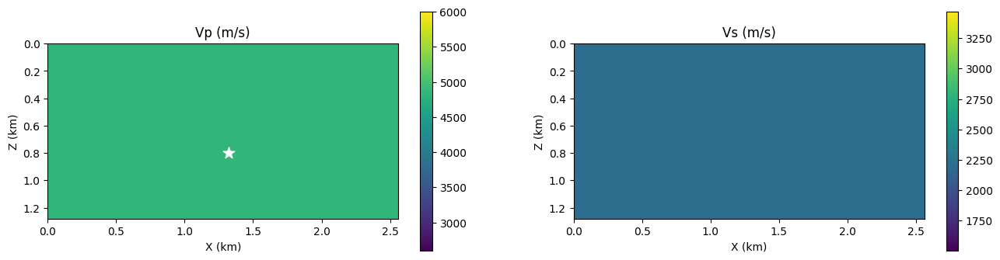

In [7]:
# Create a figure with 2 side-by-side subplots to show Vp and Vs models
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(16, 4))
# Plot Vp field (colorbar in m/s)
cbar1 = axes[0].imshow(vp, extent=[0, 128*20/1000, 64*20/1000, 0], 
                       vmin=2600, vmax=6000)
axes[0].set_title('Vp (m/s)')
axes[0].set_xlabel('X (km)')
axes[0].set_ylabel('Z (km)')
# Plot Vs field (colorbar scaled accordingly)
cbar2 = axes[1].imshow(vs, extent=[0, 128*20/1000, 64*20/1000, 0], 
                       vmin=2600/1.73, vmax=6000/1.73)
axes[1].set_title('Vs (m/s)')
axes[1].set_xlabel('X (km)')
axes[1].set_ylabel('Z (km)')
# Overlay focal source location on Vp plot
axes[0].scatter(foc_x / 1000, foc_z / 1000, marker='*', 
                s=120, color='white', label='Focal Center')
# Add colorbars to both subplots
fig.colorbar(cbar1, ax=axes[0])
fig.colorbar(cbar2, ax=axes[1])
plt.show()

# Data Preparation

In [8]:
class SpectralConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, modes1, modes2):
        super(SpectralConv2d, self).__init__()
        """
        2D Fourier layer for the FNO.
        Performs: FFT → complex linear transform in frequency domain → inverse FFT.
        Only a subset of the lowest-frequency Fourier modes are retained.
        """

        self.in_channels = in_channels
        self.out_channels = out_channels
        self.modes1 = modes1  # Number of Fourier modes in height direction
        self.modes2 = modes2  # Number of Fourier modes in width direction

        # Scale factor for initialization
        self.scale = 1 / (in_channels * out_channels)

        # Learnable complex-valued weights for selected Fourier modes
        self.weights1 = nn.Parameter(self.scale * torch.rand(in_channels, out_channels, self.modes1, self.modes2, dtype=torch.cfloat))
        self.weights2 = nn.Parameter(self.scale * torch.rand(in_channels, out_channels, self.modes1, self.modes2, dtype=torch.cfloat))

    def compl_mul2d(self, input, weights):
        """
        Perform complex multiplication using Einstein summation.
        Input: (B, in_channels, H, W_freq), Weights: (in_channels, out_channels, H, W_freq)
        Output: (B, out_channels, H, W_freq)
        """
        return torch.einsum("bixy,ioxy->boxy", input, weights)

    def forward(self, x):
        # x: (B, in_channels, H, W), spatial domain
        batchsize = x.shape[0]

        # Apply 2D FFT to convert to frequency domain
        x_ft = torch.fft.rfft2(x)

        # Allocate zero output in Fourier domain (only for selected modes)
        out_ft = torch.zeros(batchsize, self.out_channels, x.size(-2), x.size(-1)//2 + 1,
                             dtype=torch.cfloat, device=x.device)

        # Multiply selected low-frequency modes with learnable complex weights
        out_ft[:, :, :self.modes1, :self.modes2] = self.compl_mul2d(
            x_ft[:, :, :self.modes1, :self.modes2], self.weights1)
        out_ft[:, :, -self.modes1:, :self.modes2] = self.compl_mul2d(
            x_ft[:, :, -self.modes1:, :self.modes2], self.weights2)

        # Inverse FFT to return to spatial domain
        x = torch.fft.irfft2(out_ft, s=(x.size(-2), x.size(-1)))
        return x


class FNO2d(nn.Module):
    def __init__(self, modes1, modes2, width, input_channel=6, output_channel=2):
        super(FNO2d, self).__init__()
        """
        2D Fourier Neural Operator (FNO) model.
        Architecture:
        1. Lift input to high-dimensional space using fc0.
        2. Apply 4 Fourier-integral layers (spectral convolution + pointwise conv).
        3. Project back to 2-channel output (vx, vz) using fc1 and fc2.
        """

        self.modes1 = modes1  # number of Fourier modes in height
        self.modes2 = modes2  # number of Fourier modes in width
        self.width = width    # number of channels/features in hidden layers
        self.padding = 12     # pad to reduce edge artifacts (for non-periodic BCs)

        # Input lifting layer: from 6-channel input to internal width
        # Input channels: [vx, vz, vp, vs, x_coord, y_coord]
        self.fc0 = nn.Linear(input_channel, self.width)

        # 4 layers of spectral + pointwise convolution blocks
        self.conv0 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv1 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv2 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv3 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)

        self.w0 = nn.Conv2d(self.width, self.width, 1)  # Pointwise conv for residual
        self.w1 = nn.Conv2d(self.width, self.width, 1)
        self.w2 = nn.Conv2d(self.width, self.width, 1)
        self.w3 = nn.Conv2d(self.width, self.width, 1)

        # Final projection layers: width → 32 → 2
        self.fc1 = nn.Linear(self.width, 32)
        self.fc2 = nn.Linear(32, output_channel)  # Output 2 components: vx and vz

    def forward(self, x):
        # Add normalized spatial coordinates as input channels
        grid = self.get_grid(x.shape, x.device)  # shape: (B, H, W, 2)
        x = torch.cat((x, grid), dim=-1)         # now x has 6 channels

        # Project to hidden width dimension
        x = self.fc0(x)                           # (B, H, W, width)
        x = x.permute(0, 3, 1, 2)                 # (B, width, H, W)

        # Pad for better boundary behavior
        x = F.pad(x, [0, self.padding, 0, self.padding])

        # 4 spectral layers with GELU activation
        x = F.gelu(self.conv0(x) + self.w0(x))
        x = F.gelu(self.conv1(x) + self.w1(x))
        x = F.gelu(self.conv2(x) + self.w2(x))
        x = self.conv3(x) + self.w3(x)

        # Remove padding
        x = x[..., :-self.padding, :-self.padding]

        # Project back to original spatial layout
        x = x.permute(0, 2, 3, 1)  # (B, H, W, width)
        x = F.gelu(self.fc1(x))
        x = self.fc2(x)            # Final output: (B, H, W, 2)
        return x

    def get_grid(self, shape, device):
        """
        Generate normalized [0,1] grid of x and y coordinates to provide positional context.
        Output shape: (B, H, W, 2)
        """
        batchsize, size_x, size_y = shape[0], shape[1], shape[2]
        gridx = torch.linspace(0, 1, size_x, device=device).reshape(1, size_x, 1, 1).repeat(batchsize, 1, size_y, 1)
        gridy = torch.linspace(0, 1, size_y, device=device).reshape(1, 1, size_y, 1).repeat(batchsize, size_x, 1, 1)
        return torch.cat((gridx, gridy), dim=-1)


In [10]:
# Define grid and time dimensions
nx = 128       # number of grid points in x-direction
nz = 64        # number of grid points in z-direction
nt = 60        # number of time steps in each wavefield

# Preallocate arrays to store all data
# all_wavefield: shape (n_samples, nt, nz, nx, 2) for vx and vz components
all_wavefield = np.zeros((number_of_samples, nt, nz, nx, 2))

# all_vp and all_vs: shape (n_samples, nz, nx) for P-wave and S-wave velocities
all_vp = np.zeros((number_of_samples, nz, nx))
all_vs = np.zeros((number_of_samples, nz, nx))

# Loop over each saved waveform file and populate the data arrays
for i, one_wf_path in enumerate(all_waveforms):
    sample = np.load(one_wf_path, allow_pickle=True)  # Load .npy file as dictionary

    # Extract vx and vz wavefield components
    wavefield_vx = sample.item().get('wavefield_vx')  # shape: (nt, nz, nx)
    wavefield_vz = sample.item().get('wavefield_vz')  # shape: (nt, nz, nx)

    # Extract velocity models
    vp = sample.item().get('vp')  # shape: (nz, nx)
    vs = sample.item().get('vs')  # shape: (nz, nx)

    # Assign to preallocated arrays
    all_vp[i] = vp
    all_vs[i] = vs
    all_wavefield[i, :, :, :, 0] = wavefield_vx
    all_wavefield[i, :, :, :, 1] = wavefield_vz

# Define a normalization function (standard score)
def normalize(data):
    mean = np.mean(data)
    std = np.std(data)
    standardized_data_numpy = (data - mean) / std
    return standardized_data_numpy, mean, std

# Normalize the wavefield data (standardization over entire dataset)
all_wavefield, wavefield_mean, wavefield_std = normalize(all_wavefield)
all_vs, vs_mean, vs_std = normalize(all_vs)
all_vp, vp_mean, vp_std = normalize(all_vp)

In [11]:
np.random.seed(0)

# Randomly select 80% of the indices to use for training (no replacement)
train_idx = np.random.choice(len(all_wavefield), int(len(all_wavefield) * 0.8), replace=False)
# The remaining 20% of indices are used for validation
val_idx = list(set(np.arange(0, len(all_wavefield)).tolist()) - set(train_idx))

# Slice the wavefield and velocity data into training and validation sets, removing the first 12 timesteps
train_wavefield = all_wavefield[train_idx, 12:]  # shape: (N_train, nt, nz, nx, 2)
train_vp = all_vp[train_idx]                # shape: (N_train, nz, nx)
train_vs = all_vs[train_idx]                # shape: (N_train, nz, nx)

val_wavefield  = all_wavefield[val_idx, 12:]     # shape: (N_val, nt, nz, nx, 2)
val_vp  = all_vp[val_idx]                   # shape: (N_val, nz, nx)
val_vs  = all_vs[val_idx]                   # shape: (N_val, nz, nx)

# Print the resulting shapes to verify the split
print(train_wavefield.shape, val_wavefield.shape)

(400, 48, 64, 128, 2) (100, 48, 64, 128, 2)


In [12]:
class MultiStepDataset(Dataset):
    def __init__(self, wavefield, vp, vs, rollout_steps):
        self.wavefield = wavefield      # (N, T, nz, nx, 2)
        self.vp = vp                    # (N, nz, nx)
        self.vs = vs                    # (N, nz, nx)
        self.rollout_steps = rollout_steps

    def __len__(self):
        return len(self.wavefield) * self._num_valid_t0s()     # N samples

    def __getitem__(self, idx):
        num_valid_t0s = self._num_valid_t0s()

        n_idx, t_idx = divmod(idx, num_valid_t0s)
        
        # Initial input state (nz, nx, 4)
        vp_ = self.vp[n_idx, :, :, None]   # (nz, nx, 1)
        vs_ = self.vs[n_idx, :, :, None]
        x0 = np.concatenate([self.wavefield[n_idx, t_idx], vp_, vs_], axis=-1)
        # expected next frames (rollout_steps, nz, nx, 2)
        Y =  self.wavefield[n_idx, t_idx + 1:t_idx + 1 + self.rollout_steps]
        return torch.tensor(x0, dtype=torch.float32), torch.tensor(Y, dtype=torch.float32)

    def _num_valid_t0s(self):
        return self.wavefield.shape[1] - self.rollout_steps

In [13]:
dataset_train = MultiStepDataset(train_wavefield, train_vp, train_vs, rollout_steps=1)
train_loader = DataLoader(
    dataset_train,
    batch_size=16,
    shuffle=True
)

dataset_val = MultiStepDataset(val_wavefield, val_vp, val_vs, rollout_steps=1)
val_loader = DataLoader(
    dataset_val,
    batch_size=64,
    shuffle=False
)

# Prepare training data: create input-output pairs for one-step wavefield prediction
# Inputs: [vx_t, vz_t, vp, vs]; Output: [vx_{t+1}, vz_{t+1}]
X_list_train, Y_list_train = [], []

# Loop over time steps (starting from t=12 to exclude early wavefront buildup)
for t in tqdm.tqdm(range(12, train_wavefield.shape[1] - 1)):
    w_t = train_wavefield[:, t]        # Current wavefield at time t (shape: N, 64, 128, 2)
    w_tp1 = train_wavefield[:, t + 1]  # Target wavefield at next time step (t+1)

    vp_ = train_vp[:, :, :, None]      # Expand vp to (N, 64, 128, 1) for channel concatenation
    vs_ = train_vs[:, :, :, None]      # Expand vs to (N, 64, 128, 1)

    # Combine wavefield at t with static velocity model (vp, vs) → (N, 64, 128, 4)
    X = np.concatenate([w_t, vp_, vs_], axis=-1)

    X_list_train.append(X)
    Y_list_train.append(w_tp1)

# Stack all time steps into a single training dataset
X_train = np.concatenate(X_list_train, axis=0)  # Shape: (N_train * T, 64, 128, 4)
Y_train = np.concatenate(Y_list_train, axis=0)  # Shape: (N_train * T, 64, 128, 2)


# Prepare validation data in the same way
X_list_val, Y_list_val = [], []

for t in tqdm.tqdm(range(12, val_wavefield.shape[1] - 1)):
    w_t = val_wavefield[:, t]
    w_tp1 = val_wavefield[:, t + 1]
    vp_ = val_vp[:, :, :, None]
    vs_ = val_vs[:, :, :, None]
    X = np.concatenate([w_t, vp_, vs_], axis=-1)
    X_list_val.append(X)
    Y_list_val.append(w_tp1)

X_val = np.concatenate(X_list_val, axis=0)  # Shape: (N_val * T, 64, 128, 4)
Y_val = np.concatenate(Y_list_val, axis=0)  # Shape: (N_val * T, 64, 128, 2)

train_loader = DataLoader(
    TensorDataset(torch.tensor(X_train, dtype=torch.float32),
                  torch.tensor(Y_train, dtype=torch.float32)),
    batch_size=16,
    shuffle=True
)

val_loader = DataLoader(
    TensorDataset(torch.tensor(X_val, dtype=torch.float32),
                  torch.tensor(Y_val, dtype=torch.float32)),
    batch_size=64,
    shuffle=False
)

In [14]:
def predict_autoregressive(model, x0, n_frames):
    # ----------- Perform Autoregressive Prediction -----------
    predicted_frames = []

    vp = x0[...,2:3]
    vs = x0[...,3:4]
    
    x = x0
    for _ in range(n_frames):  # Predict from t=start_frame+1 to t=59
        # Model inference
        output = model(x).reshape(-1, nz, nx, 2)  # shape: (B, 64, 128, 2)
        predicted_frames.append(output)

        # Use the output as the next input (autoregressive update)
        x = torch.cat([output, vp, vs], dim=-1)  # reattach vp, vs

    return torch.stack(predicted_frames, dim=1) # shape: (B, T, nz, nx, 2)

In [16]:
# ----------- Hyperparameters -----------
epochs = 200                  # Total number of training epochs
lr = 5e-4                     # Initial learning rate

# ----------- Model, Optimizer, and Scheduler -----------
model = FNO2d(modes1=10, modes2=20, width=32).to(device)  # Initialize FNO model

optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

# ----------- Loss Function and Tracking -----------
criterion = nn.MSELoss()
train_losses, single_val_losses, full_val_losses = [], [], []

# ----------- Training Loop -----------
for epoch in tqdm.tqdm(range(epochs), desc='Training'):
    model.train()
    running_train_loss = 0.0

    rollout_steps = 1 + epoch//20
    dataset_train.rollout_steps = rollout_steps
    
    for x_batch, y_batch in train_loader:
        x_batch, y_batch = x_batch.to(device), y_batch.to(device)

        optimizer.zero_grad()
        preds = predict_autoregressive(model, x_batch, rollout_steps).reshape(-1, rollout_steps, nz, nx, 2)  # Reshape to match label shape (B, T nz, nx 2)
        loss = criterion(preds.reshape(len(x_batch), -1), y_batch.reshape(len(y_batch), -1))
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item()

    avg_train_loss = running_train_loss / len(train_loader)
    
    scheduler.step()  # Adjust learning rate

    # ----------- Validation Loop -----------
    model.eval()

    #single step validation
    running_single_val_loss = 0.0

    dataset_val.rollout_steps = 1
    with torch.no_grad():
        for x_val, y_val in val_loader:
            x_val, y_val = x_val.to(device), y_val.to(device)
            preds = predict_autoregressive(model, x_val, 1).reshape(-1, rollout_steps, nz, nx, 2)  # Reshape to match label shape (1, T nz, nx 2)
            loss = criterion(preds.reshape(len(x_val), -1), y_val.reshape(len(y_val), -1))
            running_single_val_loss += loss.item()

    avg_single_val_loss = running_single_val_loss / len(val_loader)
    
    #full length validation
    running_full_val_loss = 0.0

    full_length = 45
    dataset_val.rollout_steps = full_length
    with torch.no_grad():
        for x_val, y_val in val_loader:
            x_val, y_val = x_val.to(device), y_val.to(device)
            preds = predict_autoregressive(model, x_val, full_length).reshape(-1, rollout_steps, nz, nx, 2)  # Reshape to match label shape (B, T, nz, nx 2)
            loss = criterion(preds.reshape(len(x_val), -1), y_val.reshape(len(y_val), -1))
            running_full_val_loss += loss.item() 

    avg_full_val_loss = running_full_val_loss / len(val_loader)
    

    train_losses.append(avg_train_loss)
    single_val_losses.append(avg_single_val_loss)
    full_val_losses.append(avg_full_val_loss)

    # Progress display
    print(f"Epoch {epoch+1:03d} | Train Loss: {avg_train_loss:.6f} | Single Val Loss: {avg_single_val_loss:.6f} | Full Val Loss {avg_full_val_loss:.6f}")


Training:   0%|▎                                                                     | 1/200 [01:19<4:22:15, 79.07s/it]

Epoch 001 | Train Loss: 0.235556 | Single Val Loss: 0.105446 | Full Val Loss 11.512753


Training:   0%|▎                                                                    | 1/200 [01:59<6:37:23, 119.82s/it]


KeyboardInterrupt: 

In [20]:
torch.save(model, "./fno4waves2d_64_128.pickle")

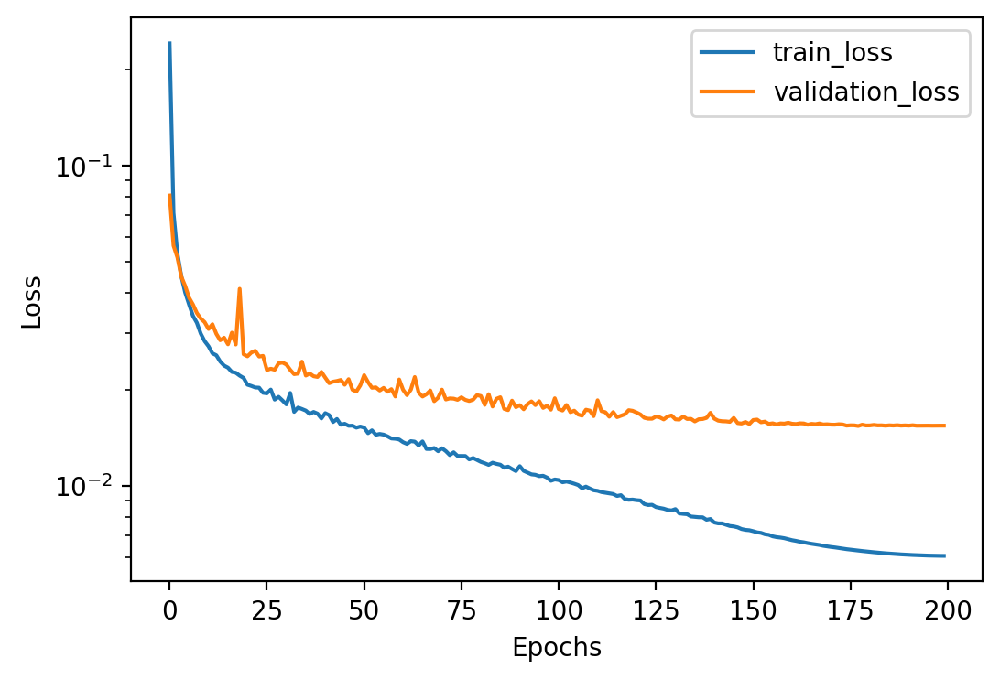

In [23]:
fig, ax = plt.subplots(figsize=(6, 4), dpi=200)
ax.plot(train_losses, label='train_loss')
ax.plot(single_val_losses , label='single_validation_loss')
ax.plot(full_val_losses , label='full_validation_loss')
plt.legend()
ax.set_yscale('log')
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
fig.show()

In [31]:
# ----------- Setup Inference Parameters -----------
sample_id = 0                  # Index of training sample to test
start_frame = 14                # Starting time step for prediction

# ----------- Extract Initial Inputs from Training Set -----------
# Get wavefield (vx, vz), and velocity model (vp, vs) for the selected sample
wavefield_seq = train_wavefield[sample_id]  # shape: (60, 64, 128, 2)
vp = train_vp[sample_id]                    # shape: (64, 128)
vs = train_vs[sample_id]                    # shape: (64, 128)

# Get the current wavefield snapshot at the prediction start time
initial_snapshot = wavefield_seq[start_frame]  # shape: (64, 128, 2)

# Construct the model input: [vx, vz, vp, vs]
# Add batch dimension and concatenate velocity fields
current_input = np.zeros((1, 64, 128, 4), dtype=np.float32)
current_input[..., :2] = initial_snapshot
current_input[..., 2] = vp
current_input[..., 3] = vs

# ----------- Perform Autoregressive Prediction -----------
predicted_frames = []

with torch.no_grad():
    for _ in range(60 - start_frame - 1):  # Predict from t=start_frame+1 to t=59
        input_tensor = torch.tensor(current_input, dtype=torch.float32).to(device)

        # Model inference
        output = model(input_tensor).cpu().numpy()  # shape: (1, 64, 128, 2)
        predicted_frames.append(output[0])          # Remove batch dimension

        # Use the output as the next input (autoregressive update)
        current_input[..., :2] = output[0]  # Update only vx, vz

# ----------- Combine Ground Truth (Before) and Prediction (After) -----------
# Final predicted sequence: true wavefield up to start_frame, then predictions
predicted_wavefield = np.concatenate((wavefield_seq[:start_frame+1], np.array(predicted_frames)), axis=0)  # shape: (60, 64, 128, 2)
plot_wavefield_video_pred_gt(predicted_wavefield[...,0], predicted_wavefield[...,1], 
                     wavefield_seq[...,0], wavefield_seq[...,1], save=True, title='training_exmaple')

MovieWriter ffmpeg unavailable; using Pillow instead.


In [36]:
# ----------- Setup Inference Parameters -----------
sample_id = 20                  # Index of validation sample to test
start_frame = 14                # Starting time step for prediction

# ----------- Extract Initial Inputs from Validation Set -----------
# Get wavefield (vx, vz), and velocity model (vp, vs) for the selected sample
wavefield_seq = val_wavefield[sample_id]  # shape: (60, 64, 128, 2)
vp = val_vp[sample_id]                    # shape: (64, 128)
vs = val_vs[sample_id]                    # shape: (64, 128)

# Get the current wavefield snapshot at the prediction start time
initial_snapshot = wavefield_seq[start_frame]  # shape: (64, 128, 2)

# Construct the model input: [vx, vz, vp, vs]
# Add batch dimension and concatenate velocity fields
current_input = np.zeros((1, 64, 128, 4), dtype=np.float32)
current_input[..., :2] = initial_snapshot
current_input[..., 2] = vp
current_input[..., 3] = vs

# ----------- Perform Autoregressive Prediction -----------
predicted_frames = []

with torch.no_grad():
    for _ in range(60 - start_frame - 1):  # Predict from t=start_frame+1 to t=59
        input_tensor = torch.tensor(current_input, dtype=torch.float32).to(device)

        # Model inference
        output = model(input_tensor).cpu().numpy()  # shape: (1, 64, 128, 2)
        predicted_frames.append(output[0])          # Remove batch dimension

        # Use the output as the next input (autoregressive update)
        current_input[..., :2] = output[0]  # Update only vx, vz

# ----------- Combine Ground Truth (Before) and Prediction (After) -----------
# Final predicted sequence: true wavefield up to start_frame, then predictions
predicted_wavefield = np.concatenate((wavefield_seq[:start_frame+1], np.array(predicted_frames)), axis=0)  # shape: (60, 64, 128, 2)
plot_wavefield_video_pred_gt(predicted_wavefield[...,0], predicted_wavefield[...,1], 
                     wavefield_seq[...,0], wavefield_seq[...,1], save=True, title='validation_exmaple')

MovieWriter ffmpeg unavailable; using Pillow instead.


# Make Prediction on the Test Set

In [31]:
model = torch.load("./fno4waves2d_64_128.pickle", map_location=torch.device(device))

/tmp/ipykernel_252205/4281608414.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load("./fno4waves2d_64_128.pickle", map_location=torch.device(device))


In [32]:
all_waveforms_test = glob.glob('./layered_simulation_test/*') + glob.glob('./random_field_simulation_test/*')

number_of_samples_test = len(all_waveforms_test)
print('Number of samples for test ', number_of_samples_test)
# Sort using the number extracted from the filename
all_waveforms_test = sorted(all_waveforms_test, key=lambda x: int(re.search(r'(\d+)\.npy$', x).group(1)))
all_waveforms_test

Number of samples for test  100


['./layered_simulation_test/0.npy',
 './layered_simulation_test/1.npy',
 './layered_simulation_test/2.npy',
 './layered_simulation_test/3.npy',
 './layered_simulation_test/4.npy',
 './layered_simulation_test/5.npy',
 './layered_simulation_test/6.npy',
 './layered_simulation_test/7.npy',
 './layered_simulation_test/8.npy',
 './layered_simulation_test/9.npy',
 './layered_simulation_test/10.npy',
 './layered_simulation_test/11.npy',
 './layered_simulation_test/12.npy',
 './layered_simulation_test/13.npy',
 './layered_simulation_test/14.npy',
 './layered_simulation_test/15.npy',
 './layered_simulation_test/16.npy',
 './layered_simulation_test/17.npy',
 './layered_simulation_test/18.npy',
 './layered_simulation_test/19.npy',
 './layered_simulation_test/20.npy',
 './layered_simulation_test/21.npy',
 './layered_simulation_test/22.npy',
 './layered_simulation_test/23.npy',
 './layered_simulation_test/24.npy',
 './layered_simulation_test/25.npy',
 './layered_simulation_test/26.npy',
 './layered

In [33]:
# Define grid and time dimensions
nx = 128       # number of grid points in x-direction
nz = 64        # number of grid points in z-direction
nt_test = 15        # number of time steps in each wavefield

all_wavefield_test = np.zeros((number_of_samples_test, nt_test, nz, nx, 2))

# all_vp and all_vs: shape (n_samples, nz, nx) for P-wave and S-wave velocities
all_vp_test = np.zeros((number_of_samples_test, nz, nx))
all_vs_test = np.zeros((number_of_samples_test, nz, nx))

# Loop over each saved waveform file and populate the data arrays
for i, one_wf_path in enumerate(all_waveforms_test):
    sample = np.load(one_wf_path, allow_pickle=True)  # Load .npy file as dictionary

    # Extract vx and vz wavefield components
    wavefield_vx = sample.item().get('wavefield_vx')  # shape: (nt, nz, nx)
    wavefield_vz = sample.item().get('wavefield_vz')  # shape: (nt, nz, nx)

    # Extract velocity models
    vp = sample.item().get('vp')  # shape: (nz, nx)
    vs = sample.item().get('vs')  # shape: (nz, nx)

    # Assign to preallocated arrays
    all_vp_test[i] = vp
    all_vs_test[i] = vs
    all_wavefield_test[i, :, :, :, 0] = wavefield_vx
    all_wavefield_test[i, :, :, :, 1] = wavefield_vz

all_wavefield_test = (all_wavefield_test - wavefield_mean) / wavefield_std
all_vp_test = (all_vp_test - vp_mean) / vp_std
all_vs_test = (all_vs_test - vs_mean) / vs_std

print(all_wavefield_test.shape, all_vp_test.shape, all_vs_test.shape)

(100, 15, 64, 128, 2) (100, 64, 128) (100, 64, 128)


In [61]:
# Output container: 100 samples, 45 time steps, 64×128 grid, 2 components (vx, vz)
n_samples_test = all_wavefield_test.shape[0]
nt_future = 45

# Initialize output array
all_predictions_test = np.zeros((n_samples_test, nt_future, nz, nx, 2), dtype=np.float32)

# Loop over each test sample
for sample_id in tqdm.tqdm(range(n_samples_test), desc="Predicting test set"):
    # Extract initial 15-frame wavefield and velocity model
    wavefield_seq = all_wavefield_test[sample_id]  # (15, 64, 128, 2)
    vp = all_vp_test[sample_id]                    # (64, 128)
    vs = all_vs_test[sample_id]                    # (64, 128)

    # Start autoregressive prediction from frame 14
    current_input = np.zeros((1, nz, nx, 4), dtype=np.float32)
    current_input[..., :2] = wavefield_seq[-1]     # Use last given frame as input
    current_input[..., 2] = vp
    current_input[..., 3] = vs

    # Collect predicted frames for this sample
    predicted_seq = []

    with torch.no_grad():
        for _ in range(nt_future):
            input_tensor = torch.tensor(current_input, dtype=torch.float32).to(device)
            output = model(input_tensor).cpu().numpy()  # shape: (1, 64, 128, 2)
            predicted_frame = output[0]
            predicted_seq.append(predicted_frame)
            current_input[..., :2] = predicted_frame  # update vx, vz

    # Save all predicted frames for this sample
    all_predictions_test[sample_id] = np.stack(predicted_seq, axis=0)

# Final shape: (100, 45, 64, 128, 2)
print("Prediction complete:", all_predictions_test.shape)

Predicting test set: 100%|██████████| 100/100 [02:56<00:00,  1.77s/it]

Prediction complete: (100, 45, 64, 128, 2)


In [81]:
### THIS IS IMPORTANT, TRANSFORM THE DATA BACK
all_predictions_test = all_predictions_test * wavefield_std + wavefield_mean
wavefield_data = all_predictions_test # shape (100, 45, 64, 128, 2)
flattened_per_sample = wavefield_data.reshape(100, -1).astype('float32')
# Create a DataFrame and save to CSV
df = pd.DataFrame(flattened_per_sample).T
df.insert(0, 'ID', np.arange(len(df)))
df.to_csv("wavefield_predictions.csv", index=False)

In [57]:
sample_2_show = 55
first_few_frames = all_wavefield_test[sample_2_show] * wavefield_std + wavefield_mean
pred_frames = all_predictions_test[sample_2_show]
all_frames = np.concatenate((first_few_frames, pred_frames), axis=0)
plot_wavefield_video(all_frames[...,0], all_frames[...,1], save=True, title='test')

MovieWriter ffmpeg unavailable; using Pillow instead.
